# Crash Data Exploratory Stats 🚗💨💥💥🤳

*Data downloaded from [UC Berkeley TIMS](https://tims.berkeley.edu/tools/query/summary.php)*

In [1]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx
import plotly.express as px
import plotly.graph_objects as go
import csv
import folium

In [2]:
df = pd.read_csv('data/Crashes.csv',quoting=csv.QUOTE_NONE,on_bad_lines='skip')

In [3]:
df.head()

,CASE_ID,ACCIDENT_YEAR,PROC_DATE,JURIS,COLLISION_DATE,COLLISION_TIME,OFFICER_ID,REPORTING_DISTRICT,DAY_OF_WEEK,CHP_SHIFT,...,COUNT_MC_KILLED,COUNT_MC_INJURED,PRIMARY_RAMP,SECONDARY_RAMP,LATITUDE,LONGITUDE,COUNTY,CITY,POINT_X,POINT_Y
0,9207380,2021,2021-03-10,1956,2021-01-07,1058,1292,6,4,5,...,0,0,"""- ""","""- """,NaN,NaN,"""LOS ANGELES""","""REDONDO BEACH""",-118.381340,33.824310
1,9217074,2021,2021-03-16,1941,2021-01-20,2253,5745,NaN,3,5,...,0,0,"""- ""","""- """,NaN,NaN,"""LOS ANGELES""","""LONG BEACH""",-118.185486,33.831760
2,9221008,2021,2021-03-25,1941,2021-02-02,2037,11118,901-T,2,5,...,0,0,"""- ""","""- """,NaN,NaN,"""LOS ANGELES""","""LONG BEACH""",-118.167641,33.816563
3,9221947,2021,2021-03-16,1942,2021-02-13,1430,34426,1145,6,5,...,0,0,"""- ""","""- """,NaN,NaN,"""LOS ANGELES""","""LOS ANGELES""",-118.251266,34.100010
4,9224683,2021,2021-03-09,1900,2021-01-14,1756,517022,0458,4,5,...,0,0,"""- ""","""- """,NaN,NaN,"""LOS ANGELES""",NORWALK,-118.075340,33.887611


In [4]:
df.columns

Index(['CASE_ID', 'ACCIDENT_YEAR', 'PROC_DATE', 'JURIS', 'COLLISION_DATE',
       'COLLISION_TIME', 'OFFICER_ID', 'REPORTING_DISTRICT', 'DAY_OF_WEEK',
       'CHP_SHIFT', 'POPULATION', 'CNTY_CITY_LOC', 'SPECIAL_COND', 'BEAT_TYPE',
       'CHP_BEAT_TYPE', 'CITY_DIVISION_LAPD', 'CHP_BEAT_CLASS', 'BEAT_NUMBER',
       'PRIMARY_RD', 'SECONDARY_RD', 'DISTANCE', 'DIRECTION', 'INTERSECTION',
       'WEATHER_1', 'WEATHER_2', 'STATE_HWY_IND', 'CALTRANS_COUNTY',
       'CALTRANS_DISTRICT', 'STATE_ROUTE', 'ROUTE_SUFFIX', 'POSTMILE_PREFIX',
       'POSTMILE', 'LOCATION_TYPE', 'RAMP_INTERSECTION', 'SIDE_OF_HWY',
       'TOW_AWAY', 'COLLISION_SEVERITY', 'NUMBER_KILLED', 'NUMBER_INJURED',
       'PARTY_COUNT', 'PRIMARY_COLL_FACTOR', 'PCF_CODE_OF_VIOL',
       'PCF_VIOL_CATEGORY', 'PCF_VIOLATION', 'PCF_VIOL_SUBSECTION',
       'HIT_AND_RUN', 'TYPE_OF_COLLISION', 'MVIW', 'PED_ACTION',
       'ROAD_SURFACE', 'ROAD_COND_1', 'ROAD_COND_2', 'LIGHTING',
       'CONTROL_DEVICE', 'CHP_ROAD_TYPE', 'PEDESTRIAN_

In [5]:
df.sort_values(by='COLLISION_TIME',inplace=True)
print(df[['COLLISION_TIME']].head(10))
print(df[['COLLISION_TIME']].tail(10))

       COLLISION_TIME
16726               0
4459                0
4457                0
1351                0
23169               0
12550               0
19703               0
15327               0
17593               0
15394               0
       COLLISION_TIME
17630            2500
17978            2500
20549            2500
15782            2500
1878             2500
13508            2500
10459            2500
11214            2500
8304             2500
3069             2500


In [6]:
#figuring out what 2500 means
print(df.loc[df['COLLISION_TIME']==2500])

        CASE_ID  ACCIDENT_YEAR   PROC_DATE  JURIS COLLISION_DATE  \
14121   9108107           2021  2021-02-01   1900     2021-01-04   
20702  81507622           2021  2021-06-28   1942     2021-06-25   
17732   9258531           2021  2021-05-13   1942     2021-04-14   
1185   91951555           2021  2022-12-23   9530     2021-09-05   
21194  91418888           2021  2021-03-02   9550     2021-02-23   
5896    9291773           2021  2021-07-23   1942     2021-06-27   
4979   91663708           2021  2021-12-28   9545     2021-10-11   
17647   9254276           2021  2021-05-20   1925     2021-04-07   
11995   9306342           2021  2021-09-16   1942     2021-08-01   
14800  91459363           2021  2021-04-27   9545     2021-03-11   
604     9238132           2021  2021-05-19   1913     2021-02-25   
20602  81455719           2021  2021-04-22   1942     2021-04-07   
5080   92026851           2021  2023-03-23   9530     2021-05-04   
17630   9253636           2021  2021-04-29   195

In [7]:
def time_formatter(x, digits=4):
    return '0'*(digits-len(x)) + x
    

In [8]:
df['COLLISION_TIME'] = df['COLLISION_TIME'].astype(str).apply(time_formatter)
df['COLLISION_TIME']

16726    0000
4459     0000
4457     0000
1351     0000
23169    0000
         ... 
13508    2500
10459    2500
11214    2500
8304     2500
3069     2500
Name: COLLISION_TIME, Length: 23376, dtype: object

In [9]:
df['COLLISION_TIME'] = df['COLLISION_TIME'].str[:2] + ":" + df['COLLISION_TIME'].str[-2:]
df['COLLISION_TIME']

16726    00:00
4459     00:00
4457     00:00
1351     00:00
23169    00:00
         ...  
13508    25:00
10459    25:00
11214    25:00
8304     25:00
3069     25:00
Name: COLLISION_TIME, Length: 23376, dtype: object

In [10]:
df['time_interval'] = df['COLLISION_TIME'].str[:2].astype(int)-df['COLLISION_TIME'].str[:2].astype(int)%3
df['time_interval'] = df['time_interval'].astype(str).apply(time_formatter,args=(2,)) + ":00-" + (df['time_interval']+2).astype(str).apply(time_formatter,args=(2,))  + ':59'
df['time_interval']

16726    00:00-02:59
4459     00:00-02:59
4457     00:00-02:59
1351     00:00-02:59
23169    00:00-02:59
            ...     
13508    24:00-26:59
10459    24:00-26:59
11214    24:00-26:59
8304     24:00-26:59
3069     24:00-26:59
Name: time_interval, Length: 23376, dtype: object

In [11]:
print(df['WEATHER_1'].unique())

['B' 'A' 'E' 'C' '-' 'F' 'D' 'G']


In [12]:
print(df['WEATHER_2'].unique())

['C' '-' 'G' 'B' 'E' 'F' 'D']


In [13]:
print(df['DAY_OF_WEEK'].unique())

[4 7 6 3 5 1 2]


In [14]:
days = {1: 'SUN', 2: 'MON',3: 'TUE',4: 'WED',5: 'THU',6: 'FRI',7: 'SAT'}

In [15]:
df['DAY_OF_WEEK_FULL'] = df['DAY_OF_WEEK'].map(days)
df['DAY_OF_WEEK_FULL']

16726    WED
4459     SAT
4457     SAT
1351     SAT
23169    FRI
        ... 
13508    SAT
10459    FRI
11214    TUE
8304     WED
3069     THU
Name: DAY_OF_WEEK_FULL, Length: 23376, dtype: object

In [16]:
df_heatmap = df[['DAY_OF_WEEK_FULL','time_interval','CASE_ID']].groupby(['DAY_OF_WEEK_FULL','time_interval'],as_index=False).count()
df_heatmap

,DAY_OF_WEEK_FULL,time_interval,CASE_ID
0,FRI,00:00-02:59,354
1,FRI,03:00-05:59,186
2,FRI,06:00-08:59,252
3,FRI,09:00-11:59,394
4,FRI,12:00-14:59,627
...,...,...,...
58,WED,12:00-14:59,543
59,WED,15:00-17:59,690
60,WED,18:00-20:59,580
61,WED,21:00-23:59,367


In [17]:
time_intervals = df['time_interval'].unique().tolist()
table_heatmap = pd.DataFrame(0,index = time_intervals,columns=days.values())
table_heatmap

,SUN,MON,TUE,WED,THU,FRI,SAT
00:00-02:59,0,0,0,0,0,0,0
03:00-05:59,0,0,0,0,0,0,0
06:00-08:59,0,0,0,0,0,0,0
09:00-11:59,0,0,0,0,0,0,0
12:00-14:59,0,0,0,0,0,0,0
15:00-17:59,0,0,0,0,0,0,0
18:00-20:59,0,0,0,0,0,0,0
21:00-23:59,0,0,0,0,0,0,0
24:00-26:59,0,0,0,0,0,0,0


In [18]:
for time in time_intervals:
    for day in days.values():
        table_heatmap.at[time,day] = df_heatmap.loc[(df_heatmap['DAY_OF_WEEK_FULL']==day) & (df_heatmap['time_interval']==time),'CASE_ID']
table_heatmap

/tmp/ipykernel_144/103458214.py:3: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  table_heatmap.at[time,day] = df_heatmap.loc[(df_heatmap['DAY_OF_WEEK_FULL']==day) & (df_heatmap['time_interval']==time),'CASE_ID']


,SUN,MON,TUE,WED,THU,FRI,SAT
00:00-02:59,213,131,150,178,186,354,396
03:00-05:59,161,155,135,139,178,186,248
06:00-08:59,425,410,381,415,378,252,172
09:00-11:59,368,382,395,393,394,394,346
12:00-14:59,509,535,545,543,663,627,484
15:00-17:59,697,741,741,690,887,649,586
18:00-20:59,473,546,548,580,709,548,550
21:00-23:59,297,295,326,367,457,457,388
24:00-26:59,4,3,4,3,4,1,4


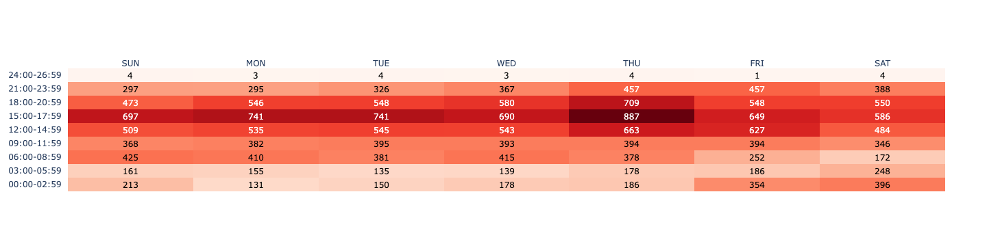

In [19]:
import plotly.figure_factory as ff
fig = ff.create_annotated_heatmap(table_heatmap.to_numpy() , x=list(days.values()) , y=time_intervals, colorscale='Reds')
fig.show()

In [20]:
df['COLLISION_DATE']

16726    2021-12-30
4459     2021-08-15
4457     2021-08-15
1351     2021-08-22
23169    2021-11-06
            ...    
13508    2021-11-07
10459    2021-01-30
11214    2021-05-12
8304     2021-05-20
3069     2021-06-11
Name: COLLISION_DATE, Length: 23376, dtype: object

In [21]:
df['MONTH'] = df['COLLISION_DATE'].str[5:7]
months = df['MONTH'].unique().tolist()
months.sort()
months

['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12']

/tmp/ipykernel_144/3533492044.py:12: FutureWarning:

Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead



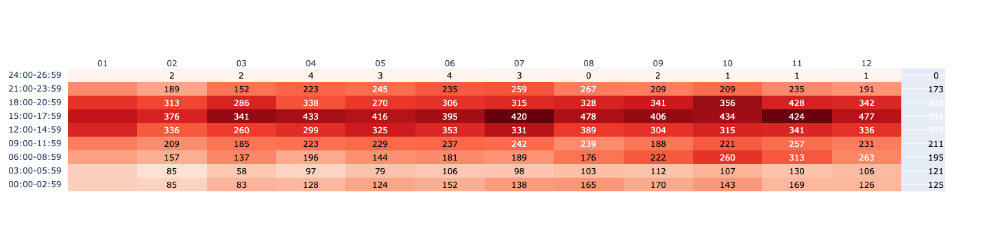

In [22]:
def collisioncount_heatmap(data = df, row = 'time_interval',col = 'MONTH'):
    df_heatmap = data[[col,row,'CASE_ID']].groupby([col,row],as_index=False).count()
    rows = data[row].unique().tolist()
    rows.sort()
    cols = data[col].unique().tolist()
    cols.sort()
    table_heatmap = pd.DataFrame(0,index = rows,columns=cols)
    
    for r in rows:
        for c in cols:
            try:
                table_heatmap.at[r,c] = df_heatmap.loc[(df_heatmap[col]==c) & (df_heatmap[row]==r),'CASE_ID']
            except:
                pass
    fig = ff.create_annotated_heatmap(table_heatmap.to_numpy() , x=cols,y=rows,colorscale='Reds')
    fig.show()
collisioncount_heatmap()

In [23]:
print(table_heatmap.to_numpy())


[[213 131 150 178 186 354 396]
 [161 155 135 139 178 186 248]
 [425 410 381 415 378 252 172]
 [368 382 395 393 394 394 346]
 [509 535 545 543 663 627 484]
 [697 741 741 690 887 649 586]
 [473 546 548 580 709 548 550]
 [297 295 326 367 457 457 388]
 [  4   3   4   3   4   1   4]]


/tmp/ipykernel_144/284269038.py:12: FutureWarning:

Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead



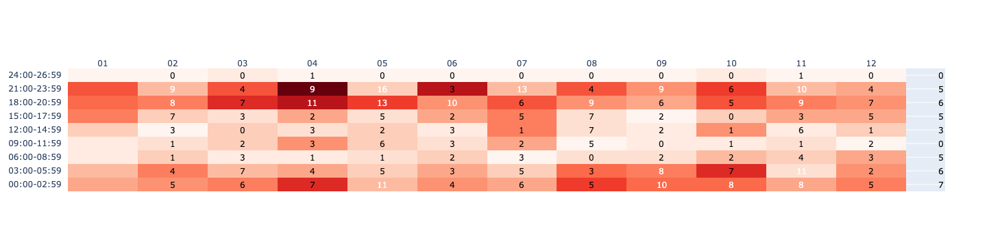

In [24]:

def collisionsum_heatmap(data = df, row = 'time_interval',col = 'MONTH',sum = 'NUMBER_KILLED'):
    df_heatmap = data[[col,row,sum]].groupby([col,row],as_index=False).sum()
    rows = data[row].unique().tolist()
    rows.sort()
    rows.reverse()
    cols = data[col].unique().tolist()
    cols.sort()
    table_heatmap = pd.DataFrame(0,index = rows,columns=cols)
    
    for r in rows:
        for c in cols:
            try:
                table_heatmap.at[r,c] = df_heatmap.loc[(df_heatmap[col]==c) & (df_heatmap[row]==r),sum]
            except:
                pass
    fig = ff.create_annotated_heatmap(table_heatmap.to_numpy() , x=cols,y=rows,colorscale='Reds')
    fig.show()


collisionsum_heatmap()




/tmp/ipykernel_144/284269038.py:12: FutureWarning:

Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead



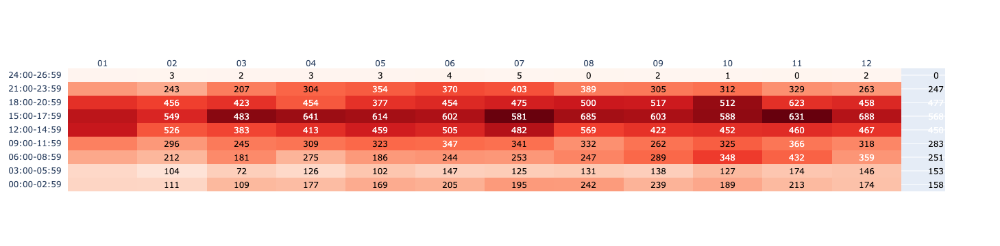

In [25]:
collisionsum_heatmap(sum='NUMBER_INJURED')

/tmp/ipykernel_144/284269038.py:12: FutureWarning:

Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead



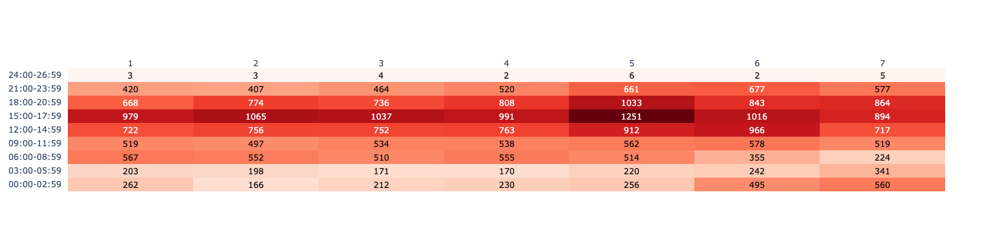

In [26]:
collisionsum_heatmap(col='DAY_OF_WEEK',sum='NUMBER_INJURED')

/tmp/ipykernel_144/284269038.py:12: FutureWarning:

Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead



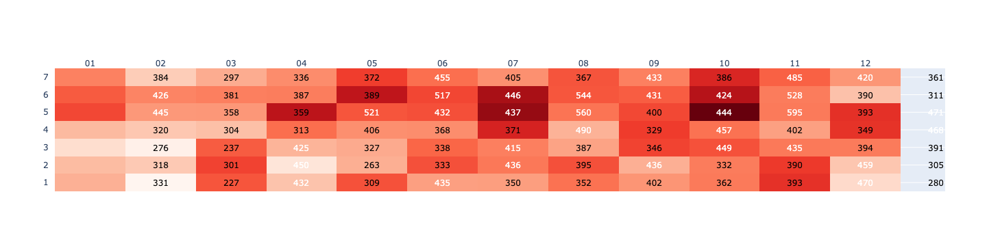

In [27]:
collisionsum_heatmap(row='DAY_OF_WEEK',col='MONTH',sum='NUMBER_INJURED')

In [28]:
gdf = gpd.GeoDataFrame(df, 
                       crs='epsg:4326',
                       geometry=gpd.points_from_xy(df.LONGITUDE, df.LATITUDE))
gdf.head()

,CASE_ID,ACCIDENT_YEAR,PROC_DATE,JURIS,COLLISION_DATE,COLLISION_TIME,OFFICER_ID,REPORTING_DISTRICT,DAY_OF_WEEK,CHP_SHIFT,...,LATITUDE,LONGITUDE,COUNTY,CITY,POINT_X,POINT_Y,time_interval,DAY_OF_WEEK_FULL,MONTH,geometry
16726,91672164,2021,2022-01-06,9535,2021-12-30,00:00,022418,NaN,4,3,...,33.97361,-118.167969,"""LOS ANGELES""",BELL,-118.167961,33.973610,00:00-02:59,WED,12,POINT (-118.16797 33.97361)
4459,91554947,2021,2021-08-26,9590,2021-08-15,00:00,021912,NaN,7,3,...,34.05801,-118.253967,"""LOS ANGELES""","""LOS ANGELES""",-118.253983,34.058022,00:00-02:59,SAT,08,POINT (-118.25397 34.05801)
4457,91554832,2021,2021-08-26,9575,2021-08-15,00:00,022490,NaN,7,3,...,34.22858,-118.392021,"""LOS ANGELES""","""LOS ANGELES""",-118.392052,34.228519,00:00-02:59,SAT,08,POINT (-118.39202 34.22858)
1351,9276276,2021,2021-09-28,1942,2021-08-22,00:00,43432,0524,7,5,...,NaN,NaN,"""LOS ANGELES""","""LOS ANGELES""",-118.279533,33.779034,00:00-02:59,SAT,08,POINT EMPTY
23169,91628538,2021,2021-11-18,9590,2021-11-06,00:00,022417,NaN,6,3,...,34.03664,-118.270889,"""LOS ANGELES""","""LOS ANGELES""",-118.270767,34.036819,00:00-02:59,FRI,11,POINT (-118.27089 34.03664)


<Axes: >

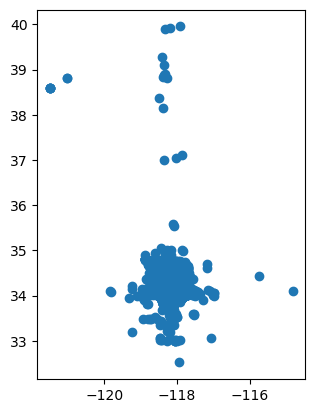

In [29]:
gdf.plot()

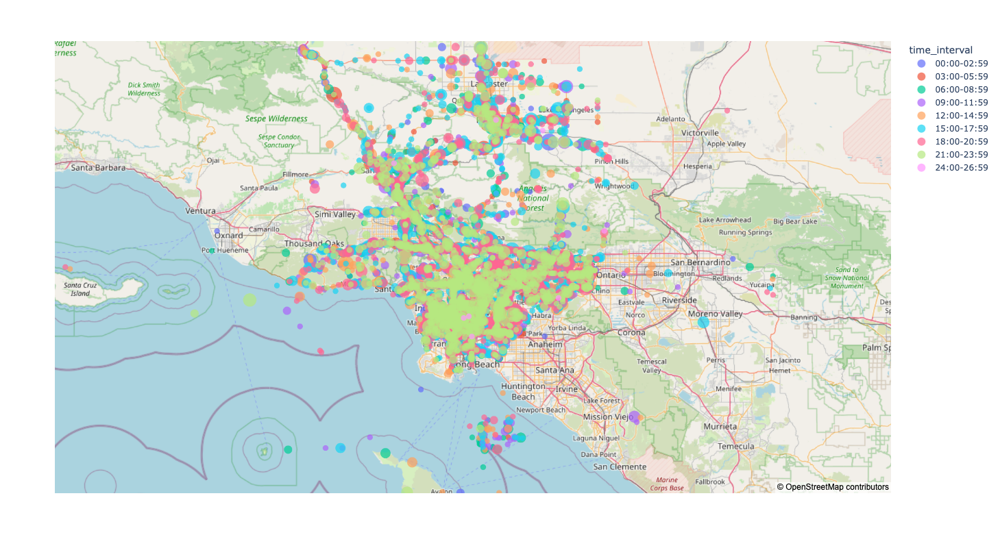

In [30]:
fig = px.scatter_mapbox(gdf,
                        lat='LATITUDE',
                        lon='LONGITUDE',
                        color='time_interval',
                        size='NUMBER_INJURED',
                        color_continuous_scale=px.colors.cyclical.IceFire,
                        mapbox_style="open-street-map")

# options on the layout
fig.update_layout(
    width = 800,
    height = 800,
)

fig.show()

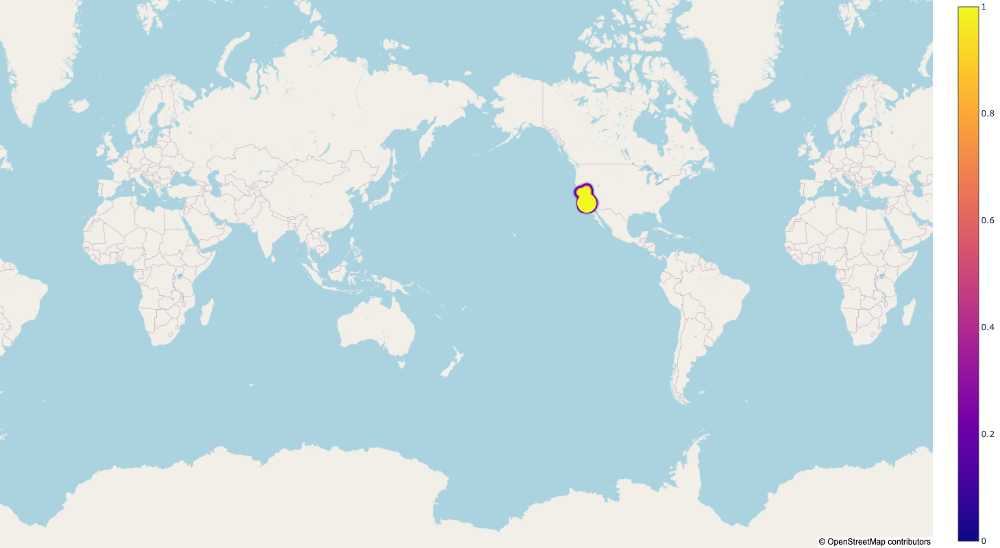

In [31]:
import plotly.graph_objects as go
fig = go.Figure(go.Densitymapbox(lat=gdf.LATITUDE, lon=gdf.LONGITUDE,
                                 radius=10))
fig.update_layout(mapbox_style="open-street-map", mapbox_center_lon=180)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.update_layout(
    width = 800,
    height = 800,
)
fig.show()

In [32]:
df.loc[(df.LONGITUDE<-118.5)&(df.LONGITUDE>-118.6)&(df.LATITUDE>33.5)&(df.LATITUDE<33.6)]

,CASE_ID,ACCIDENT_YEAR,PROC_DATE,JURIS,COLLISION_DATE,COLLISION_TIME,OFFICER_ID,REPORTING_DISTRICT,DAY_OF_WEEK,CHP_SHIFT,...,SECONDARY_RAMP,LATITUDE,LONGITUDE,COUNTY,CITY,POINT_X,POINT_Y,time_interval,DAY_OF_WEEK_FULL,MONTH


In [33]:
df.info

<bound method DataFrame.info of         CASE_ID  ACCIDENT_YEAR   PROC_DATE  JURIS COLLISION_DATE  \
16726  91672164           2021  2022-01-06   9535     2021-12-30   
4459   91554947           2021  2021-08-26   9590     2021-08-15   
4457   91554832           2021  2021-08-26   9575     2021-08-15   
1351    9276276           2021  2021-09-28   1942     2021-08-22   
23169  91628538           2021  2021-11-18   9590     2021-11-06   
...         ...            ...         ...    ...            ...   
13508   9389036           2021  2022-02-03   1942     2021-11-07   
10459   9230364           2021  2021-03-09   1900     2021-01-30   
11214   9266804           2021  2021-06-16   1900     2021-05-12   
8304   91486804           2021  2021-06-01   9525     2021-05-20   
3069    9325286           2021  2021-10-07   1900     2021-06-11   

      COLLISION_TIME OFFICER_ID REPORTING_DISTRICT  DAY_OF_WEEK  CHP_SHIFT  \
16726          00:00     022418                NaN            4          

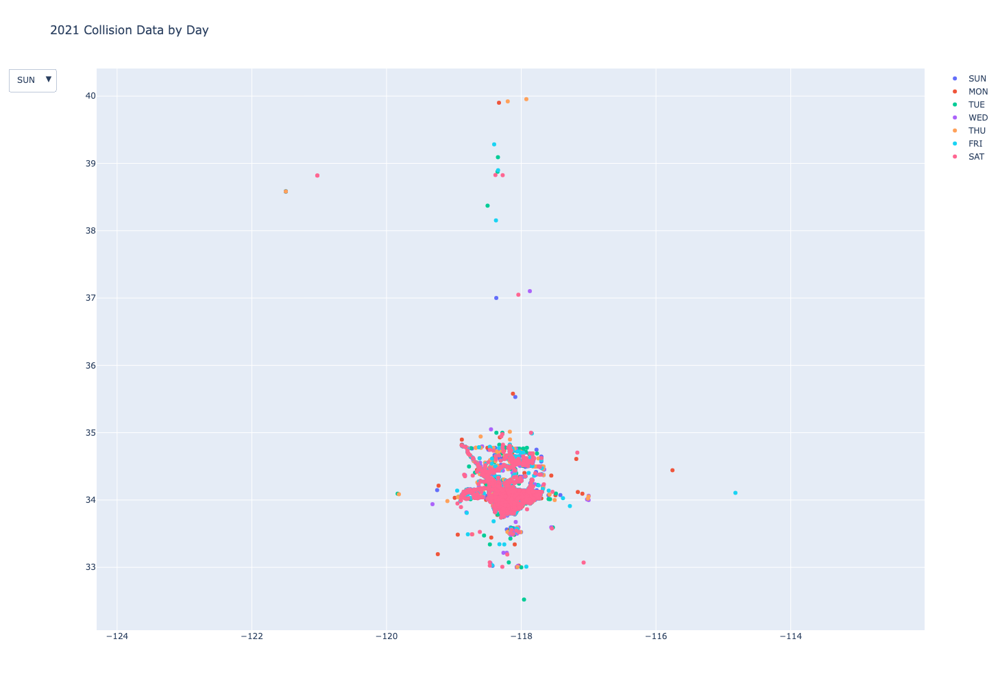

In [34]:
fig = go.Figure()

for day in days.values():
    daygdf = gdf[gdf["DAY_OF_WEEK_FULL"]==day]
    fig.add_trace(go.Scatter(
                        x=daygdf['LONGITUDE'].values.tolist(),
                        y=daygdf['LATITUDE'].values.tolist(),mode='markers',
                        #fill=daygdf['time_interval'].values.tolist()
                        name = day))

layout = go.Layout(yaxis=dict(scaleanchor="x", scaleratio=1))

fig.update_yaxes(
    scaleanchor='x',
    scaleratio = 1)

fig.update_layout(title_text='2021 Collision Data by Day')

buttonlist = []

for i,day in days.items():
    buttonlist.append(dict(label=day,
                 method="update",
                 args=[{"visible":[False]*(i-1) + [True] + [False]*(7-i)},
                       {"title":day}]))


fig.update_layout(
    width = 1000,
    height = 1000,
)
    
    

fig.update_layout(
    updatemenus=[
        dict(active=0,
            buttons=buttonlist,
        )
    ]
)

fig.show()

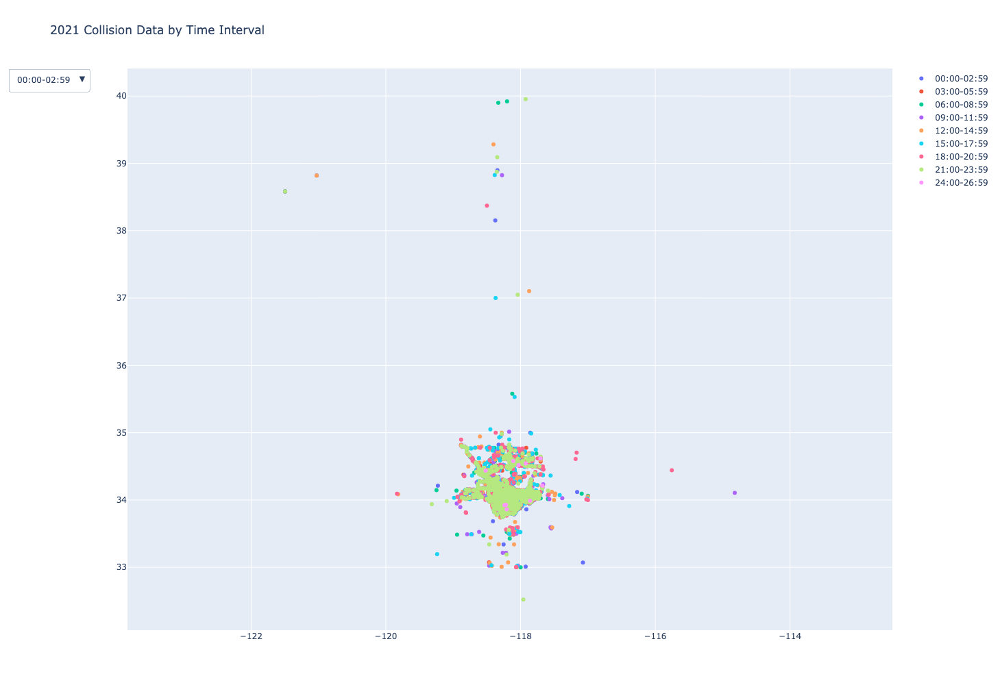

In [35]:
fig = go.Figure()

for time in time_intervals:
    timegdf = gdf[gdf["time_interval"]==time]
    fig.add_trace(go.Scatter(
                        x=timegdf['LONGITUDE'].values.tolist(),
                        y=timegdf['LATITUDE'].values.tolist(),mode='markers',
                        #fill=daygdf['time_interval'].values.tolist()
                        name = time))

layout = go.Layout(yaxis=dict(scaleanchor="x", scaleratio=1))

fig.update_yaxes(
    scaleanchor='x',
    scaleratio = 1)

fig.update_layout(title_text='2021 Collision Data by Time Interval')

buttonlist = []

for i,time in enumerate(time_intervals):
    buttonlist.append(dict(label=time,
                 method="update",
                 args=[{"visible":[False]*(i) + [True] + [False]*(6-i)},
                       {"title":time}]))


fig.update_layout(
    width = 1000,
    height = 1000,
)
    
    

fig.update_layout(
    updatemenus=[
        dict(active=0,
            buttons=buttonlist,
        )
    ]
)

fig.show()

<Axes: title={'center': 'California, United States'}, xlabel='X', ylabel='Y'>

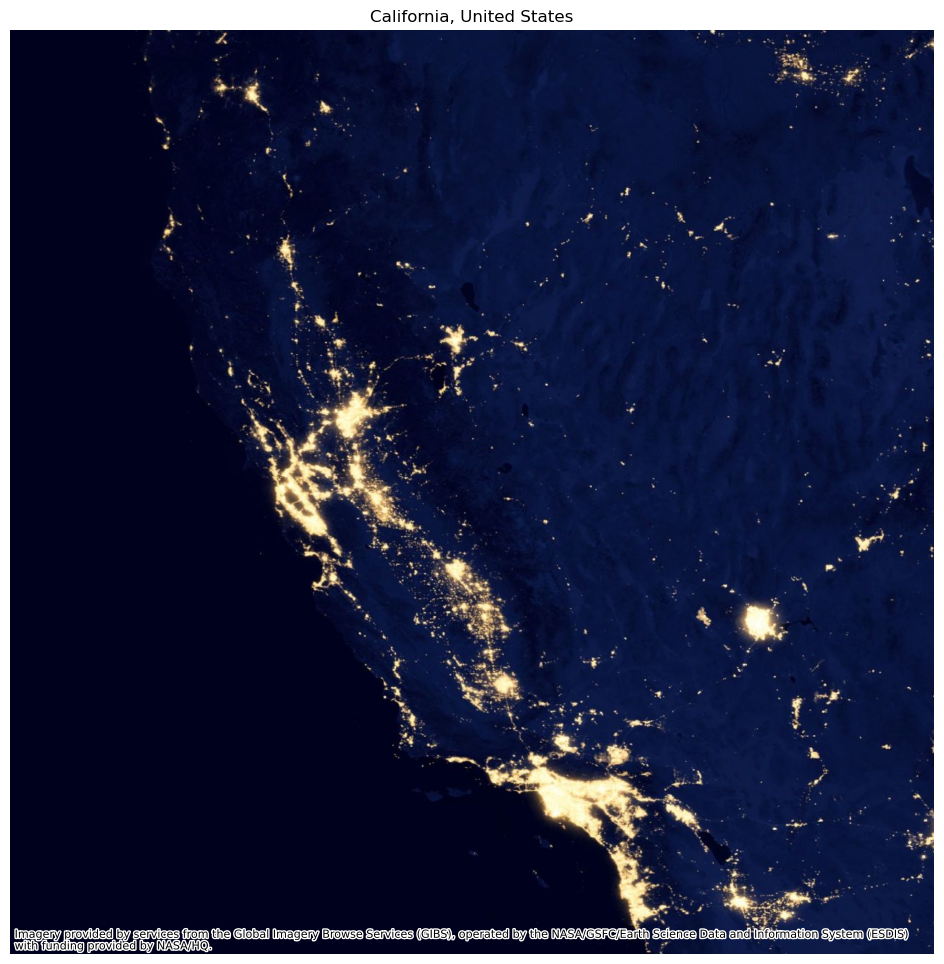

In [36]:
nightlights = ctx.providers.NASAGIBS.ViirsEarthAtNight2012
california = ctx.Place("California", source=nightlights)

california.plot()

In [37]:
gdf['PEDESTRIAN_ACCIDENT'].unique()

array([nan, 'Y'], dtype=object)

In [51]:

from folium import plugins


m = folium.Map(location=[34.2,-118.2], 
               zoom_start = 9,
               tiles='CartoDB positron', 
               attribution='CartoDB')

fg1 = folium.FeatureGroup(name='Pedestrian Accidents (Nonfatal)', show=False).add_to(m)
fg2 = folium.FeatureGroup(name='Pedestrian Accidents (Fatal)', show=False).add_to(m)

gdf_ped = gdf[~(gdf['LATITUDE'].isna() | gdf['LONGITUDE'].isna()) & (gdf['PEDESTRIAN_ACCIDENT']=='Y') & (gdf['COUNT_PED_KILLED']==0)]
gdf_ped_fat = gdf[~(gdf['LATITUDE'].isna() | gdf['LONGITUDE'].isna()) & (gdf['PEDESTRIAN_ACCIDENT']=='Y') & (gdf['COUNT_PED_KILLED']>0)]



gdf_ped_list = [(lat, lon) for lat, lon in zip(gdf_ped["LATITUDE"],gdf_ped["LONGITUDE"])]
gdf_ped_fat_list = [(lat, lon) for lat, lon in zip(gdf_ped_fat["LATITUDE"],gdf_ped_fat["LONGITUDE"])]

# Add points to the map instance
for coord in gdf_ped_list:
 folium.Marker(location=coord).add_to(fg1)

# Add points to the map instance
for coord in gdf_ped_fat_list:
 folium.Marker(location=coord,icon = folium.Icon(color="red",icon="skull", prefix='fa')).add_to(fg2)
folium.LayerControl().add_to(m)
#Show map
m


In [59]:

from folium import plugins
from folium.plugins import MarkerCluster


m = folium.Map(location=[34.2,-118.2], 
               zoom_start = 9,
               tiles='CartoDB positron', 
               attribution='CartoDB')

fg2 = folium.FeatureGroup(name='Pedestrian Accidents (Fatal)', show=False).add_to(m)
fg1 = folium.FeatureGroup(name='Pedestrian Accidents (Nonfatal)', show=False).add_to(m)

gdf_ped = gdf[~(gdf['LATITUDE'].isna() | gdf['LONGITUDE'].isna()) & (gdf['PEDESTRIAN_ACCIDENT']=='Y') & (gdf['COUNT_PED_KILLED']==0)]
gdf_ped_fat = gdf[~(gdf['LATITUDE'].isna() | gdf['LONGITUDE'].isna()) & (gdf['PEDESTRIAN_ACCIDENT']=='Y') & (gdf['COUNT_PED_KILLED']>0)]



gdf_ped_list = [(lat, lon) for lat, lon in zip(gdf_ped["LATITUDE"],gdf_ped["LONGITUDE"])]
gdf_ped_fat_list = [(lat, lon) for lat, lon in zip(gdf_ped_fat["LATITUDE"],gdf_ped_fat["LONGITUDE"])]

icon_create_function = """\
function(cluster) {
    return L.divIcon({
    html: '<b><center>' + cluster.getChildCount() + '</center></b>',
    className: 'marker-cluster marker-cluster-large',
    iconSize: new L.Point(50, 50)
    });
}"""

# Add points to the map instance
marker_cluster = MarkerCluster(
    overlay=True,
    control=True,
    icon_create_function=icon_create_function,
).add_to(fg1)

for coord in gdf_ped_list:
 folium.Marker(location=coord,icon = folium.Icon(color="pink",icon="user-injured", prefix='fa')).add_to(marker_cluster)

# Add points to the map instance
for coord in gdf_ped_fat_list:
 folium.Marker(location=coord,icon = folium.Icon(color="red",icon="skull", prefix='fa')).add_to(fg2)
folium.LayerControl().add_to(m)
#Show map
m
